In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/fraud-detection/fraudTest.csv
/kaggle/input/fraud-detection/fraudTrain.csv
/kaggle/input/creditcard-fraud-detection/creditcard.csv
/kaggle/input/creditcardfraud/creditcard.csv


In [2]:
try:
    import pycaret
except:
    !pip install pycaret

try:
    import missingno
except:
    !pip install missingno

     |████████████████████████████████| 301 kB 285 kB/s 
     |████████████████████████████████| 10.4 MB 68 kB/s 
     |████████████████████████████████| 15.6 MB 63.6 MB/s 
     |████████████████████████████████| 25.9 MB 828 kB/s 
     |████████████████████████████████| 167 kB 68.9 MB/s 
     |████████████████████████████████| 114 kB 75.8 MB/s 
     |████████████████████████████████| 24.2 MB 804 kB/s 
     |████████████████████████████████| 184 kB 66.2 MB/s 
     |████████████████████████████████| 1.0 MB 67.6 MB/s 
     |████████████████████████████████| 79 kB 7.4 MB/s 
     |████████████████████████████████| 58 kB 4.5 MB/s 
  Created wheel for databricks-cli: filename=databricks_cli-0.16.4-py3-none-any.whl size=106877 sha256=ce8868f1fd88051dbc9a886e3b111c2149c1354baec5d6840529feb20a9b8eee
  Stored in directory: /root/.cache/pip/wheels/a2/a1/6d/fa1d22ea25ed8593887437fe1c7e00f6ef307fc240ccd4dc5c
  Created wheel for pyod: filename=pyod-0.9.7-py3-none-any.whl size=136277 sha256=3567dc4999

<hr style="border: solid 3px blue;">

# Introduction

![](https://media4.giphy.com/media/jTYgOsJyYwZmQ6bKI8/giphy.gif)

Picture Credit: https://media4.giphy.com

**Oversampling and Undersampling**
> Both oversampling and undersampling involve introducing a bias to select more samples from one class than from another, to compensate for an imbalance that is either already present in the data, or likely to develop if a purely random sample were taken. Data Imbalance can be of the following types:
> 
> 1. Under-representation of a class in one or more important predictor variables. Suppose, to address the question of gender discrimination, we have survey data on salaries within a particular field, e.g., computer software. It is known women are under-represented considerably in a random sample of software engineers, which would be important when adjusting for other variables such as years employed and current level of seniority. Suppose only 20% of software engineers are women, i.e., males are 4 times as frequent as females. If we were designing a survey to gather data, we would survey 4 times as many females as males, so that in the final sample, both genders will be represented equally. (See also Stratified Sampling.)
> 2. Under-representation of one class in the outcome (dependent) variable. Suppose we want to predict, from a large clinical dataset, which patients are likely to develop a particular disease (e.g., diabetes). Assume, however, that only 10% of patients go on to develop the disease. Suppose we have a large existing dataset. We can then pick 9 times the number of patients who did not go on to develop the disease for every one patient who did.
> 
> Oversampling is generally employed more frequently than undersampling, especially when the detailed data has yet to be collected by survey, interview or otherwise. Undersampling is employed much less frequently. Overabundance of already collected data became an issue only in the "Big Data" era, and the reasons to use undersampling are mainly practical and related to resource costs. Specifically, while one needs a suitably large sample size to draw valid statistical conclusions, the data must be cleaned before it can be used. Cleansing typically involves a significant human component, and is typically specific to the dataset and the analytical problem, and therefore takes time and money. For example:
> 
> 1. Domain experts will suggest dataset-specific means of validation involving not only intra-variable checks (permissible values, maximum and minimum possible valid values, etc.), but also inter-variable checks. For example, the individual components of a differential white blood cell count must all add up to 100, because each is a percentage of the total.
> 2. Data that is embedded in narrative text (e.g., interview transcripts) must be manually coded into discrete variables that a statistical or machine-learning package can deal with. The more the data, the more the coding effort. (Sometimes, the coding can be done through software, but somebody must often write a custom, one-off program to do so, and the program's output must be tested for accuracy, in terms of false positive and false negative results.)
> For these reasons, one will typically cleanse only as much data as is needed to answer a question with reasonable statistical confidence (see Sample Size), but not more than that.

Ref: https://en.wikipedia.org/wiki/Oversampling_and_undersampling_in_data_analysis


In the case of binary classification, there may be cases where the value of the target is skewed to one side. Therefore, it is necessary to check the distribution of target values during the EDA process.

In this notebook, we examine how the data distribution is changed after oversampling and undersampling and whether imbalance can be effectively resolved through this. Finally, We draw pictures of reducing the 28-dimensional dataset to 2D. There are beautiful pictures drawn by Datasets.

After this, we try to solve the classification problem after sampling using an appropriate sampling method.

--------------------------------------
# Setting Up

In [3]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams
import plotly.express as px
from sklearn.model_selection import train_test_split
from plotly.subplots import make_subplots
import plotly.graph_objects as go

import warnings
warnings.filterwarnings("ignore")

import umap
import umap.plot
from pycaret.classification import *
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score
from sklearn.metrics import f1_score, confusion_matrix, precision_recall_curve, roc_curve
from sklearn.metrics import ConfusionMatrixDisplay

import scipy.stats as stats

-------------------------------------------------------------------------------
# Checking Target Imbalance



In [4]:
card_df = pd.read_csv('../input/creditcard-fraud-detection/creditcard.csv')
card_org = card_df.copy()

In [5]:
colors = ['gold', 'mediumturquoise']
labels = ['Normal','Fraud']
values = card_df['Class'].value_counts()/card_df['Class'].shape[0]
fig = go.Figure(data=[go.Pie(labels = labels,
                             values=values,hole=.3)])
fig.update_traces(hoverinfo='label+percent', textinfo='percent', textfont_size=20,
                  marker=dict(colors=colors, line=dict(color='white', width=0.1)))
fig.update_layout(
    title_text="Credit Card Fraud",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)
fig.show()

<span style="color:Blue"> Observation:
    
In the case of the Credit Card Fraud dataset, severe imbalance is observed.

Oversampling or undersampling should be considered.

--------------------------------
# EDA

In [6]:
card_df.head(5).T.style.set_properties(**{'background-color': 'black',
                           'color': 'white',
                           'border-color': 'white'})

,0,1,2,3,4
Time,0.000000,0.000000,1.000000,1.000000,2.000000
V1,-1.359807,1.191857,-1.358354,-0.966272,-1.158233
V2,-0.072781,0.266151,-1.340163,-0.185226,0.877737
V3,2.536347,0.166480,1.773209,1.792993,1.548718
V4,1.378155,0.448154,0.379780,-0.863291,0.403034
V5,-0.338321,0.060018,-0.503198,-0.010309,-0.407193
V6,0.462388,-0.082361,1.800499,1.247203,0.095921
V7,0.239599,-0.078803,0.791461,0.237609,0.592941
V8,0.098698,0.085102,0.247676,0.377436,-0.270533
V9,0.363787,-0.255425,-1.514654,-1.387024,0.817739


In [7]:
card_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [8]:
card_df.describe().style.set_properties(**{'background-color': 'black',
                           'color': 'white',
                           'border-color': 'white'})

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000
mean,94813.859575,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,88.349619,0.001727
std,47488.145955,1.958696,1.651309,1.516255,1.415869,1.380247,1.332271,1.237094,1.194353,1.098632,1.088850,1.020713,0.999201,0.995274,0.958596,0.915316,0.876253,0.849337,0.838176,0.814041,0.770925,0.734524,0.725702,0.624460,0.605647,0.521278,0.482227,0.403632,0.330083,250.120109,0.041527
min,0.000000,-56.407510,-72.715728,-48.325589,-5.683171,-113.743307,-26.160506,-43.557242,-73.216718,-13.434066,-24.588262,-4.797473,-18.683715,-5.791881,-19.214325,-4.498945,-14.129855,-25.162799,-9.498746,-7.213527,-54.497720,-34.830382,-10.933144,-44.807735,-2.836627,-10.295397,-2.604551,-22.565679,-15.430084,0.000000,0.000000
25%,54201.500000,-0.920373,-0.598550,-0.890365,-0.848640,-0.691597,-0.768296,-0.554076,-0.208630,-0.643098,-0.535426,-0.762494,-0.405571,-0.648539,-0.425574,-0.582884,-0.468037,-0.483748,-0.498850,-0.456299,-0.211721,-0.228395,-0.542350,-0.161846,-0.354586,-0.317145,-0.326984,-0.070840,-0.052960,5.600000,0.000000
50%,84692.000000,0.018109,0.065486,0.179846,-0.019847,-0.054336,-0.274187,0.040103,0.022358,-0.051429,-0.092917,-0.032757,0.140033,-0.013568,0.050601,0.048072,0.066413,-0.065676,-0.003636,0.003735,-0.062481,-0.029450,0.006782,-0.011193,0.040976,0.016594,-0.052139,0.001342,0.011244,22.000000,0.000000
75%,139320.500000,1.315642,0.803724,1.027196,0.743341,0.611926,0.398565,0.570436,0.327346,0.597139,0.453923,0.739593,0.618238,0.662505,0.493150,0.648821,0.523296,0.399675,0.500807,0.458949,0.133041,0.186377,0.528554,0.147642,0.439527,0.350716,0.240952,0.091045,0.078280,77.165000,0.000000
max,172792.000000,2.454930,22.057729,9.382558,16.875344,34.801666,73.301626,120.589494,20.007208,15.594995,23.745136,12.018913,7.848392,7.126883,10.526766,8.877742,17.315112,9.253526,5.041069,5.591971,39.420904,27.202839,10.503090,22.528412,4.584549,7.519589,3.517346,31.612198,33.847808,25691.160000,1.000000


<AxesSubplot:>

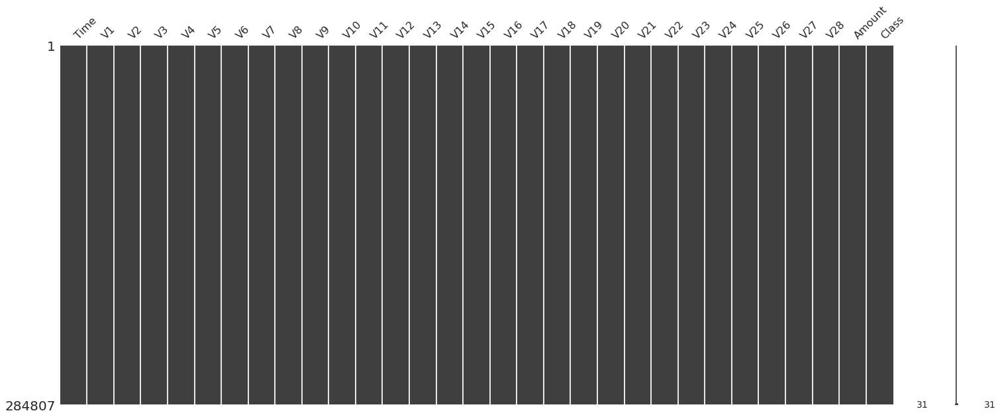

In [9]:
import missingno as msno
msno.matrix(card_df)

<span style="color:Blue"> Observation:
    
**OK! There is no missing value!**

-----------------------------------
# Checking the data type of features

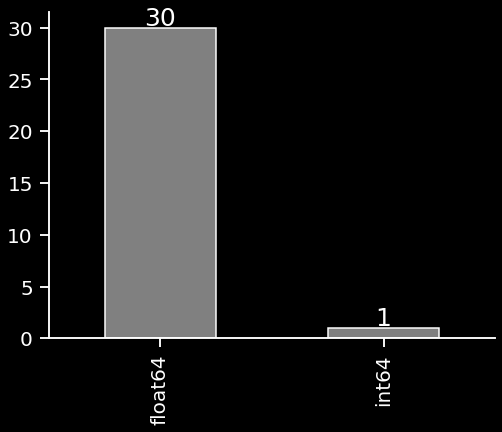

In [10]:
sns.set(style="ticks", context="talk",font_scale = 1)
plt.style.use("dark_background")
plt.figure(figsize = (8,6))
ax = card_df.dtypes.value_counts().plot(kind='bar',grid = False,fontsize=20,color='grey')
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+ p.get_width() / 2., height + 0.2, height, ha = 'center', size = 25)
sns.despine()

<span style="color:Blue"> Observation:

* All features are numerical! So, there is no need to consider categorical feature engineering!    

------------------------------------------------------------------

In [11]:
card_df = card_df.sample(n = 20000,random_state=42)

-----------------------------------------------------
# Scaling

![](https://www.researchgate.net/profile/Xiao-Li-128/publication/324486223/figure/fig3/AS:614746801860608@1523578467516/Linear-vs-Nonlinear-response.png)

Picture Credit: https://www.researchgate.net

As confirmed above, all features are numerical features. So, we are going to check if scaling is necessary.
Since we are going to use tree-based models, we will not consider linear scaling.

If you want to know more about Scaling, please refer to the notebook below.

[linear-nonlinear-scaling](https://www.kaggle.com/ohseokkim/linear-nonlinear-scaling)

In [12]:
card_df['Amount'].min()

0.0

In [13]:
numerical_cols = [cname for cname in card_df.loc[:,:'Amount'].columns if 
                  card_df[cname].min() >= 0 and
                  card_df[cname].dtype in ['int64','float64']]

In various features, it is determined that skewness greater than 1 is skewed, and only these features are subjected to nonlinear scaling.

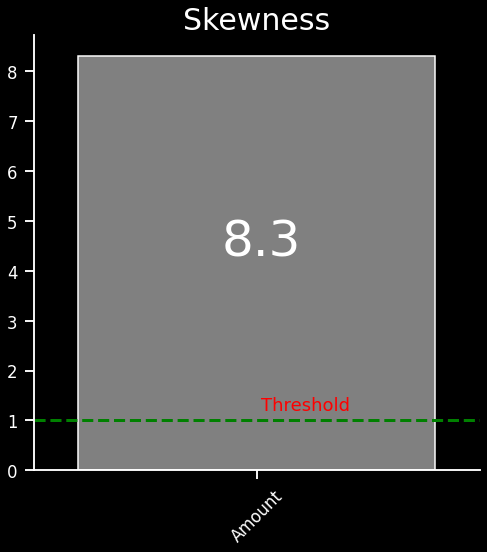

In [14]:
from scipy.stats import skew
plt.figure(figsize=(8, 8))
skew_features = card_df[numerical_cols].apply(lambda x : skew(x))
skew_features = skew_features[skew_features > 0.5].sort_values(ascending=False)
ax = sns.barplot( x =skew_features.index,y=skew_features.values,color='grey')
for p in ax.patches:
    height = p.get_height().round(1)
    ax.text(p.get_x()+ p.get_width()/2.5, height-4, height, ha = 'left', size = 50)
plt.xticks(rotation=45)
plt.text(0.01,1.2, 'Threshold',color='red')
plt.axhline(y=1, color='green', linestyle='--', linewidth=3)
plt.title('Skewness',fontsize=30)
sns.despine()

<span style="color:Blue"> Observation:

* Only Amount feature is met the condition!

In [15]:
def check_normality(feature):
    plt.figure(figsize = (8,8))
    ax1 = plt.subplot(1,1,1)
    stats.probplot(card_df[feature],dist = stats.norm, plot = ax1)
    ax1.set_title(f'{feature} Q-Q plot',fontsize=20)
    sns.despine()

    mean = card_df['Amount'].mean()
    std = card_df['Amount'].std()
    skew = card_df['Amount'].skew()
    print(f'{feature} : mean: {0:.4f}, std: {1:.4f}, skew: {2:.4f}'.format(mean, std, skew))

In [16]:
def plot_hist(feature):
    fig = px.histogram(card_df, x=feature, 
                       color="Class",
                       marginal="box",
                       barmode ="overlay",
                       histnorm ='density'
                      )  
    fig.update_layout(
        title_text=f"{feature} Distribution",
        title_font_color="white",
        legend_title_font_color="yellow",
        paper_bgcolor="black",
        plot_bgcolor='black',
        font_color="white",
    )
    fig.show()

Let's draw the distribution of the amount feature among the above skewed features.

Amount : mean: 0.0000, std: 1.0000, skew: 2.0000


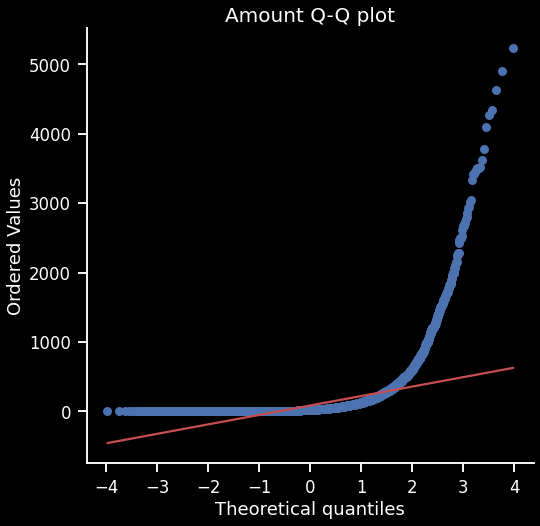

In [17]:
plot_hist("Amount")
check_normality("Amount")

<span style="color:Blue"> Observation:
* We can see that it is skewed as shown in the pictures above.

-----------------------------------------------------------
## Doing Logarithm Scaling

![](https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Logarithm_plots.png/300px-Logarithm_plots.png)

Picture Credit: https://upload.wikimedia.org

Logarithm function increases the spacing between small numbers and reduces the spacing between large numbers. When certain features are dense with values in small values, by increasing these intervals, our models increase the intervals for small values, and we can improve the performance of the model when training and testing using these values.

In [18]:
card_df[skew_features.index] = np.log1p(card_df[skew_features.index])

Amount : mean: 0.0000, std: 1.0000, skew: 2.0000


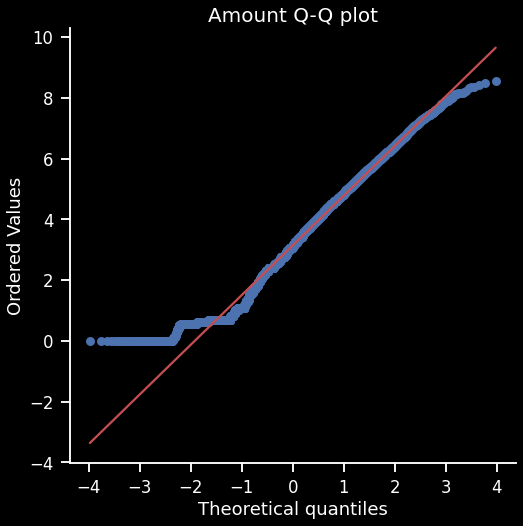

In [19]:
plot_hist("Amount")
check_normality("Amount")

<span style="color:Blue"> Observation:
* It can be seen that the skewness has improved a lot as shown in the pictures above.

--------------------------------------------------------
# Checking Correlations

First, draw a heatmap to find features that are related to classes.

In [20]:
import plotly.express as px
plt.figure(figsize=(20,20))
corr=card_df.corr().round(1)
fig = px.imshow(corr)
fig.update_layout(
    title_text="Credit Card Fraud",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)
fig.show()

<Figure size 1440x1440 with 0 Axes>

<span style="color:Blue"> Observation:
    
V3, V7, V10, V11, V12, V14, V16, and V17 have a strong correlation with target(class) compared to other features.

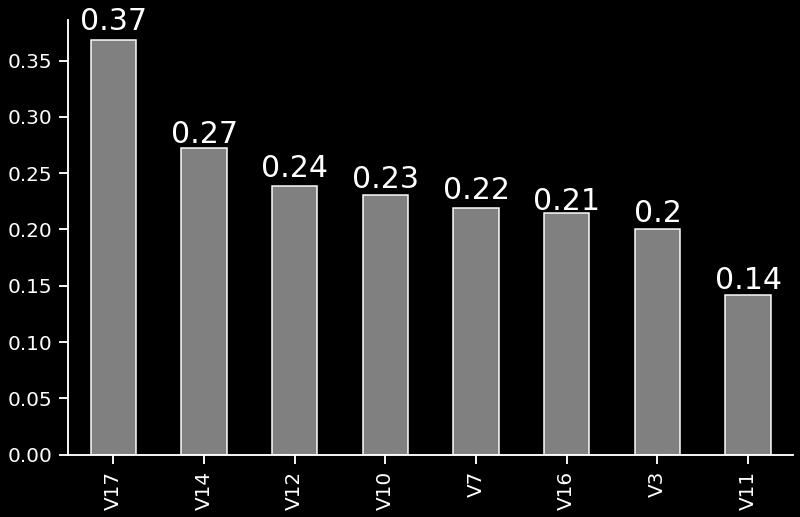

In [21]:
features = [
    "V3",
    "V7",
    "V10",
    "V11",
    "V12",
    "V14",
    "V16",
    "V17",
]

plt.figure(figsize=(13,8))
ax = abs(card_df[features].corrwith(card_df.Class)).sort_values(ascending=False).plot(kind='bar',color='grey',fontsize=20)
for p in ax.patches:
    height = p.get_height().round(2)
    ax.text(p.get_x() + p.get_width() / 2., height+0.007, height, ha = 'center', size = 30)
sns.despine()

<span style="color:Blue"> Observation:

**Looking at the above pictures, the V14 and V17 features have a high correlation with target class. Let's dig deeper into these features.**

**V14 and V17 features seem to have more correlation with Class than other features. Let's analyze the difference before and after sampling with a scatter plot of these two features.**

-------------------------------------------------------
# Splitting train and test dataset

In [22]:
def get_preprocessed_df(df=None):
    df_copy = df.copy()
    df_copy.drop('Time', axis=1, inplace=True)
    return df_copy

def get_train_test_dataset(df=None):
    df_copy = get_preprocessed_df(df)
    X_features = df_copy.loc[:,:'Amount']
    y_target = df_copy.iloc[:, -1]
    X_train, X_test, y_train, y_test = train_test_split(X_features,
                                                        y_target, 
                                                        test_size=0.3, 
                                                        random_state=0, 
                                                        stratify=y_target)
    return X_train, X_test, y_train, y_test

In [23]:
X_train, X_test, y_train, y_test = get_train_test_dataset(card_df)

--------------------------------------------------
# Checking Orignal Dataset

### Plotting histogram Plot

In [24]:
fig = px.histogram(card_df, x="V14", 
                   color="Class",
                   marginal="box",
                   barmode ="overlay",
                   histnorm ='density'
                  )  
fig.update_layout(
    title_text="Orignal Distribution",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)
fig.show()



<span style="color:Blue"> Observation:
    
The imbalacne also seems to be large. Let's think about how we can solve this.

### Plotting Scatter Plot

In [25]:
colors = ['gold', 'mediumturquoise']
fig = px.scatter(card_df, x="V17", y="V14", color="Class")
fig.update_layout(
    title_text="Original Scatter Plot",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)

In [26]:
card_df.loc[:,:'Amount'].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20000 entries, 43428 to 12947
Data columns (total 30 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Time    20000 non-null  float64
 1   V1      20000 non-null  float64
 2   V2      20000 non-null  float64
 3   V3      20000 non-null  float64
 4   V4      20000 non-null  float64
 5   V5      20000 non-null  float64
 6   V6      20000 non-null  float64
 7   V7      20000 non-null  float64
 8   V8      20000 non-null  float64
 9   V9      20000 non-null  float64
 10  V10     20000 non-null  float64
 11  V11     20000 non-null  float64
 12  V12     20000 non-null  float64
 13  V13     20000 non-null  float64
 14  V14     20000 non-null  float64
 15  V15     20000 non-null  float64
 16  V16     20000 non-null  float64
 17  V17     20000 non-null  float64
 18  V18     20000 non-null  float64
 19  V19     20000 non-null  float64
 20  V20     20000 non-null  float64
 21  V21     20000 non-null  float64

### Visualizing after Dimension Reduction

<AxesSubplot:>

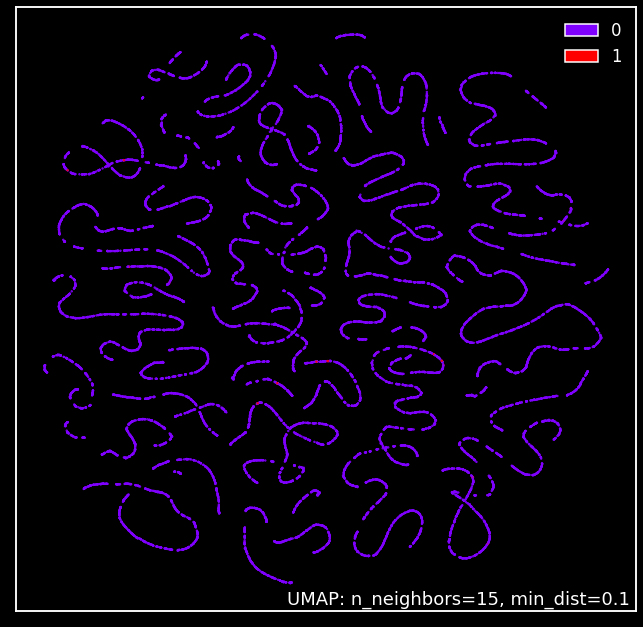

In [27]:
sns.set(style="ticks", context="talk",font_scale = 1)
plt.style.use("dark_background")
mapper = umap.UMAP().fit(card_df.loc[:,:'Amount']) 
umap.plot.points(mapper, labels=card_df.loc[:,'Class'], theme='fire')

<span style="color:Blue"> Observation:
    
* Wow! It is beatiful!
* The target is severely imbalaced. Level 1 target is too small compared to level 0 target.    

-----------------------------------------------
# Oversampling

![](https://dataaspirant.com/wp-content/uploads/2020/08/10-oversampling.png)
Picture Credit: https://dataaspirant.com

Let's oversampling V14 feature using each method and check the results.

-----------------
## SMOTE

> Synthetic prime sampling technique samples the majority class and interpolates existing prime samples to synthesize new prime instances.
> In general, it works successfully, but because it works by interpolating between fractional data, it reflects only the characteristics between fractional data of the modeling set and may be weak in data prediction in new cases.

In [28]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=0)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
print('Feature/label dataset for training before applying SMOTE: ', X_train.shape, y_train.shape)
print('Feature/label dataset for training after applying SMOTE: ', X_train_smote.shape, y_train_smote.shape)
print('Distribution of label values after applying SMOTE:\n',pd.Series(y_train_smote).value_counts())

Feature/label dataset for training before applying SMOTE:  (14000, 29) (14000,)
Feature/label dataset for training after applying SMOTE:  (27952, 29) (27952,)
Distribution of label values after applying SMOTE:
 0    13976
1    13976
Name: Class, dtype: int64


### Plotting histogram Plot

In [29]:
card_df_smote = pd.concat([X_train_smote,y_train_smote],axis=1)
fig = px.histogram(card_df_smote, x="V14", 
                   color="Class", 
                   marginal="box",
                   barmode ="overlay",
                   histnorm ='density'
                  )  
fig.update_layout(
    title_text="Oversampled by SMOTE",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)
fig.show()

<span style="color:Blue"> Observation:

If you look at the distribution of the created zero-target data, you can see that it is spread over a wide range.

### Plotting Scatter Plot

In [30]:
fig = px.scatter(card_df_smote, x="V17", y="V14", color="Class")
fig.update_layout(
    title_text="Oversampled by SMOTE",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white"
)

<span style="color:Blue"> Observation:

If you look at the result of SMOTE, it looks like lines connected between points. This is because SMOTE uses an interpolation technique.

### Visualizing after Dimension Reduction

<AxesSubplot:>

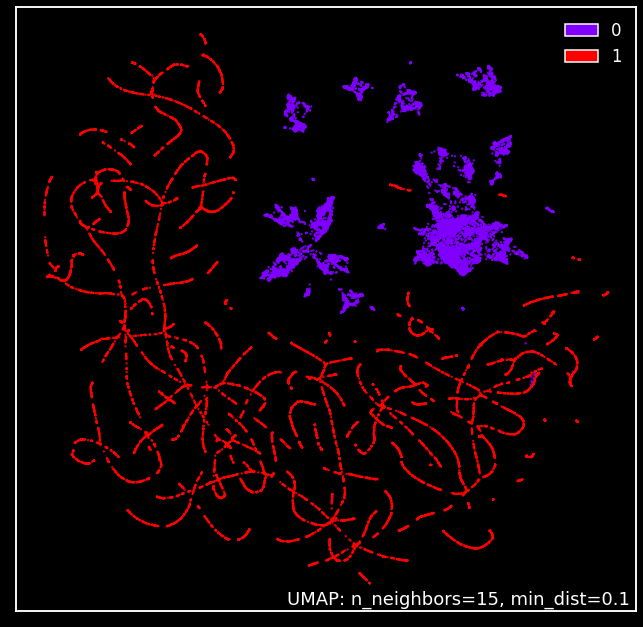

In [31]:
sns.set(style="ticks", context="talk",font_scale = 1)
plt.style.use("dark_background")

mapper = umap.UMAP().fit(card_df_smote.loc[:,:'Amount']) 
umap.plot.points(mapper, labels=card_df_smote.loc[:,'Class'], theme='fire')

<span style="color:Blue"> Observation:

You can see that the blue dots are expanding their power.

------------------
## RandomOverSampler

> Object to over-sample the minority class(es) by picking samples at random with replacement. The bootstrap can be generated in a smoothed manner.

In [32]:
from imblearn.over_sampling import RandomOverSampler

ros = RandomOverSampler(random_state=0)
X_train_ros, y_train_ros = ros.fit_resample(X_train, y_train)
print('Feature/label dataset for training before applying RandomOverSampler: ', X_train.shape, y_train.shape)
print('Feature/label dataset for training after applying RandomOverSampler: ', X_train_ros.shape, y_train_ros.shape)
print('Distribution of label values after applying RandomOverSampler: \n', pd.Series(y_train_ros).value_counts())

Feature/label dataset for training before applying RandomOverSampler:  (14000, 29) (14000,)
Feature/label dataset for training after applying RandomOverSampler:  (27952, 29) (27952,)
Distribution of label values after applying RandomOverSampler: 
 0    13976
1    13976
Name: Class, dtype: int64


### Plotting histogram Plot

In [33]:
card_df_ros = pd.concat([X_train_ros,y_train_ros],axis=1)
fig = px.histogram(card_df_ros, x="V14", 
                   color="Class", 
                   marginal="box",
                   barmode ="overlay",
                   histnorm ='density'
                  )  
fig.update_layout(
    title_text="Oversampled by RandomOverSampler",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)
fig.show()

<span style="color:Blue"> Observation:
    
It can be seen that the number of data of the normal class (value = 0) is reduced. It can be seen that the distribution of the negative class (value = 0) maintains the shape of the original distribution similarly.

### Plotting Scatter Plot

In [34]:
fig = px.scatter(card_df_ros, x="V17", y="V14", color="Class")
fig.update_layout(
    title_text="Oversampled by SMOTE",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)

<span style="color:Blue"> Observation:
    
It can be seen that the negative values increase randomly. 

### Visualizing after Dimension Reduction

<AxesSubplot:>

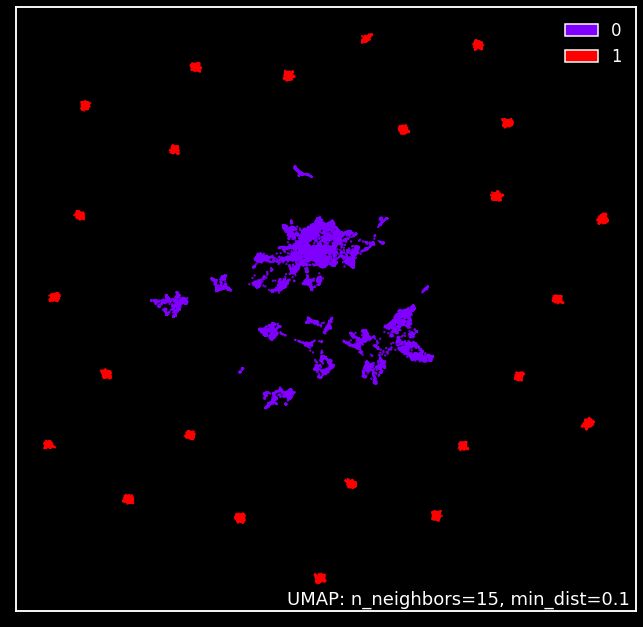

In [35]:
mapper = umap.UMAP().fit(card_df_ros.loc[:,:'Amount']) 
umap.plot.points(mapper, labels=card_df_ros.loc[:,'Class'], theme='fire')

-----------------------
## ADASYN

> This method is similar to SMOTE but it generates different number of samples depending on an estimate of the local distribution of the class to be oversampled.

In [36]:
from imblearn.over_sampling import ADASYN
adasyn = ADASYN(random_state=0)

X_train_adasyn, y_train_adasyn = adasyn.fit_resample(X_train, y_train)
print('Feature/label dataset for training before applying ADASYN: ', X_train.shape, y_train.shape)
print('Feature/label dataset for training after applying ADASYN: ', X_train_adasyn.shape, y_train_adasyn.shape)
print('Distribution of label values after applying ADASYN: \n', pd.Series(y_train_adasyn).value_counts())

Feature/label dataset for training before applying ADASYN:  (14000, 29) (14000,)
Feature/label dataset for training after applying ADASYN:  (27955, 29) (27955,)
Distribution of label values after applying ADASYN: 
 1    13979
0    13976
Name: Class, dtype: int64


### Plotting histogram Plot

In [37]:
card_df_adasyn = pd.concat([X_train_adasyn,y_train_adasyn],axis=1)
fig = px.histogram(card_df_adasyn, x="V14", 
                   color="Class", 
                   marginal="box",
                   barmode ="overlay",
                   histnorm ='density'
                  )  
fig.update_layout(
    title_text="Oversampled by ADASYN",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)
fig.show()

<span style="color:Blue"> Observation:
    
Looking at the historgram, it can be seen that both the V14 features increase the normal data (value = 0). For both V14 features, it can be confirmed that the overlapping section between fraud (value = 1) and normal (value = 0) is larger than other methods.

### Plotting Scatter Plot

In [38]:
fig = px.scatter(card_df_adasyn, x="V17", y="V14", color="Class")
fig.update_layout(
    title_text="Oversampled by ADASYN",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)

<span style="color:Blue"> Observation:
    
Similar to SMOTE, it can be confirmed that oversampling occurs through interpolation.

### Visualizing after Dimension Reduction

<AxesSubplot:>

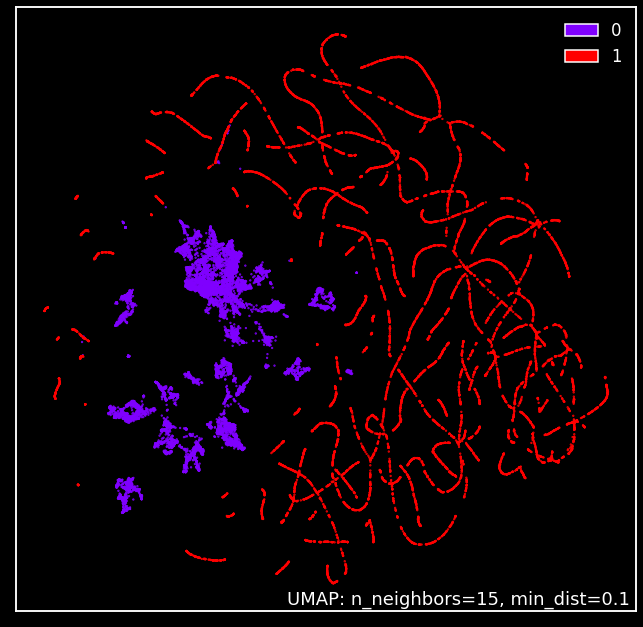

In [39]:
mapper = umap.UMAP().fit(card_df_adasyn.loc[:,:'Amount']) 
umap.plot.points(mapper, labels=card_df_adasyn.loc[:,'Class'], theme='fire')

<hr style="border: solid 3px blue;">

# Undersampling

![](https://i1.wp.com/dataaspirant.com/wp-content/uploads/2020/08/17-undersampling.png?resize=613%2C318&ssl=1)

Picture Credit: https://i1.wp.com

Let's undersampling the V14 feature using each method and check the results.

-----------------------------------------------------------
## RandomUnderSampler

> Under-sample the majority class(es) by randomly picking samples with or without replacement.

In [40]:
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(random_state=0)

X_train_rus, y_train_rus = rus.fit_resample(X_train, y_train)
print('Feature/label dataset for training before applying RandomUnderSampler: ', X_train.shape, y_train.shape)
print('Feature/label dataset for training after applying RandomUnderSampler: ', X_train_rus.shape, y_train_rus.shape)
print('Distribution of label values ​​after applying RandomUnderSampler: \n', pd.Series(y_train_rus).value_counts())

Feature/label dataset for training before applying RandomUnderSampler:  (14000, 29) (14000,)
Feature/label dataset for training after applying RandomUnderSampler:  (48, 29) (48,)
Distribution of label values ​​after applying RandomUnderSampler: 
 0    24
1    24
Name: Class, dtype: int64


<span style="color:Blue"> Observation:

It feels like a lot of the values of the normal class(value = 0) was thrown away.

### Plotting histogram Plot

In [41]:
card_df_rus = pd.concat([X_train_rus,y_train_rus],axis=1)
fig = px.histogram(card_df_rus, x="V14", 
                   color="Class", 
                   marginal="box",
                   barmode ="overlay",
                   histnorm ='density'
                  )  
fig.update_layout(
    title_text="Undersampled by RandomUnderSampler",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)
fig.show()

<span style="color:Blue"> Observation:
    
It can be seen that the number of data of the normal class (value = 0) is reduced. It can be seen that the distribution of the normal class (value = 0) maintains the shape of the original distribution similarly.

### Plotting Scatter Plot

In [42]:
fig = px.scatter(card_df_rus, x="V17", y="V14", color="Class")
fig.update_layout(
    title_text="Undersampled by RandomUnderSampler",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)

<span style="color:Blue"> Observation:

It can be seen that the fraud-level data are randomly sampled. The distribution of positive values was also changed.

### Visualizing after Dimension Reduction

<AxesSubplot:>

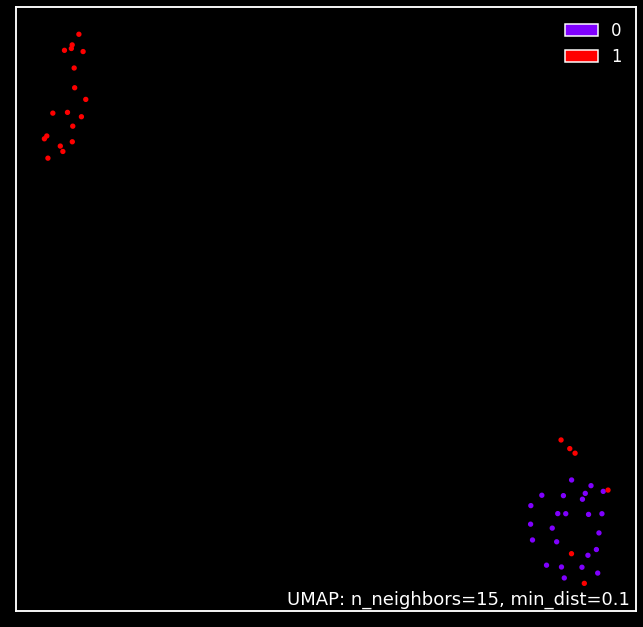

In [43]:
mapper = umap.UMAP().fit(card_df_rus.loc[:,:'Amount']) 
umap.plot.points(mapper, labels=card_df_rus.loc[:,'Class'], theme='fire')

---------------------------------------------
## Instance Hardness Threshold

> Unlike other methods, it is not a method of classifying by defining a distance, but a method of undersampling based on a classification model.
> It calculates and eliminates the probability that the classification of the model becomes difficult, such as an outlier. It is a method to remove a value with a high probability of misclassification by determining the classification algorithm and calculating the misclassification probability for each data value.

In [44]:
from sklearn.linear_model import LogisticRegression
from imblearn.under_sampling import InstanceHardnessThreshold
iht = InstanceHardnessThreshold(random_state=0,
                               estimator=LogisticRegression(solver='lbfgs', multi_class='auto'))

X_train_iht, y_train_iht = iht.fit_resample(X_train.loc[:,features], y_train)
print('Feature/label dataset for training before applying InstanceHardnessThreshold: ', X_train.shape, y_train.shape)
print('Feature/label dataset for training after applying InstanceHardnessThreshold: ', X_train_iht.shape, y_train_iht.shape)
print('Distribution of label values after applying InstanceHardnessThreshold: \n', pd.Series(y_train_iht).value_counts())

Feature/label dataset for training before applying InstanceHardnessThreshold:  (14000, 29) (14000,)
Feature/label dataset for training after applying InstanceHardnessThreshold:  (48, 8) (48,)
Distribution of label values after applying InstanceHardnessThreshold: 
 0    24
1    24
Name: Class, dtype: int64


### Plotting histogram Plot

In [45]:
card_df_iht = pd.concat([X_train_iht,y_train_iht],axis=1)
fig = px.histogram(card_df_iht, x="V14", 
                   color="Class", 
                   marginal="box",
                   barmode ="overlay",
                   histnorm ='density'
                  )  
fig.update_layout(
    title_text="Undersampled by Instance Hardness Threshold",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)
fig.show()

<span style="color:Blue"> Observation:
    
It can be seen that the number of data of the normal class (value = 0) is reduced. It can be seen that the distribution of the normal class (value=0) maintains the shape of the original distribution similarly, and it can be confirmed that the distribution of the fraud class (value=1) has a smaller variance compared to random undersampling.

### Plotting Scatter Plot

In [46]:
fig = px.scatter(card_df_iht, x="V17", y="V14", color="Class")
fig.update_layout(
    title_text="Undersampled by RandomUnderSampler",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)

### Visualizing after Dimension Reduction

<AxesSubplot:>

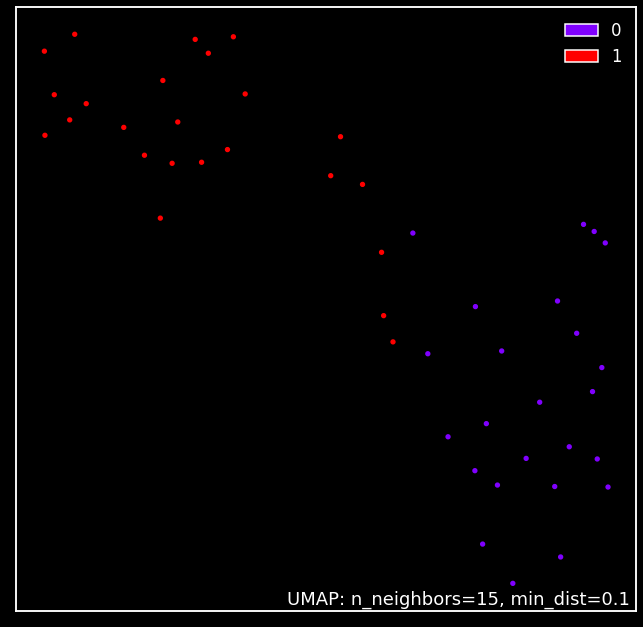

In [47]:
mapper = umap.UMAP().fit(card_df_iht.loc[:,:'V17']) 
umap.plot.points(mapper, labels=card_df_iht.loc[:,'Class'], theme='fire')

----------------------------------------------
## Near Miss

> It can be grouped under undersampling algorithms and is an efficient way to balance the data. The algorithm does this by looking at the class distribution and randomly eliminating samples from the larger class. When two points belonging to different classes are very close to each other in the distribution, this algorithm eliminates the datapoint of the larger class thereby trying to balance the distribution. 

In [48]:
from imblearn.under_sampling import NearMiss
nm = NearMiss()

X_train_nm, y_train_nm = nm.fit_resample(X_train, y_train)
print('Feature/label dataset for training before applying RandomUnderSampler: ', X_train.shape, y_train.shape)
print('Feature/label dataset for training after applying RandomUnderSampler: ', X_train_nm.shape, y_train_nm.shape)
print('Distribution of label values after applying RandomUnderSampler: \n', pd.Series(y_train_nm).value_counts())

Feature/label dataset for training before applying RandomUnderSampler:  (14000, 29) (14000,)
Feature/label dataset for training after applying RandomUnderSampler:  (48, 29) (48,)
Distribution of label values after applying RandomUnderSampler: 
 0    24
1    24
Name: Class, dtype: int64


### Plotting histogram Plot

In [49]:
card_df_nm = pd.concat([X_train_nm,y_train_nm],axis=1)
fig = px.histogram(card_df_nm, x="V14", 
                   color="Class", 
                   marginal="box",
                   barmode ="overlay",
                   histnorm ='density'
                  )  
fig.update_layout(
    title_text="Undersampled by Near Miss",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)
fig.show()

<span style="color:Blue"> Observation:
    
It can be seen that the number of data of the normal class (value = 0) is reduced. The distribution of the normal class (value=0) became a bimodal distribution in the shape of the original distribution. The shape of the original distribution is broken and is unlikely to be conducive to learning.

### Plotting Scatter Plot

In [50]:
fig = px.scatter(card_df_nm, x="V17", y="V14", color="Class")
fig.update_layout(
    title_text="Undersampled by NearMiss",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)

### Visualizing after Dimension Reduction

<AxesSubplot:>

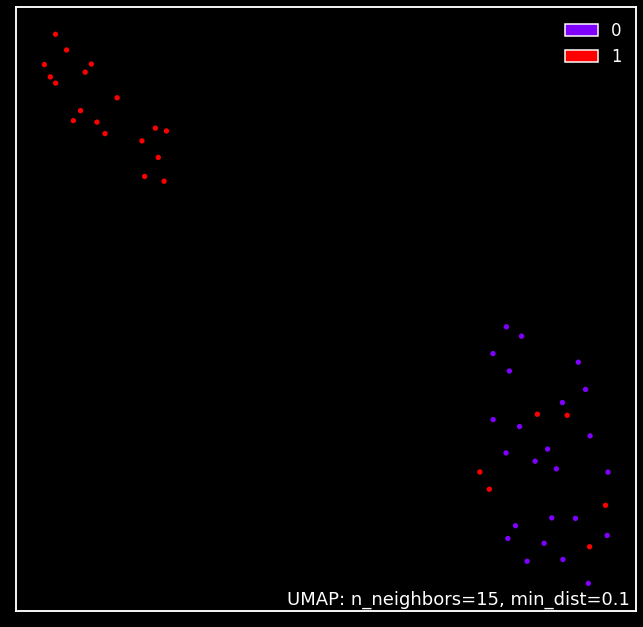

In [51]:
mapper = umap.UMAP().fit(card_df_nm.loc[:,:'Amount']) 
umap.plot.points(mapper, labels=card_df_nm.loc[:,'Class'], theme='fire')

<hr style="border: solid 3px blue;">

# Let's find Fraud

![](https://thumbs.gfycat.com/ElasticFearlessGonolek-size_restricted.gif)

Picture Credit: https://thumbs.gfycat.com

# Selecting Sampling Method

As above, oversampling/undersampling methods are checked using the creditcard fraud dataset. Additional experiments will have to be done in the future, but looking at the histogram of the main features, it seems appropriate to use SMOTE among the oversampling methods. 

In [52]:
train_df =pd.concat([X_train_smote,y_train_smote],axis=1)
X_test_smote, y_test_smote = smote.fit_resample(X_test, y_test)

In [53]:
colors = ['gold', 'mediumturquoise']
labels = ['Normal','Fraud']
values = train_df['Class'].value_counts()/train_df['Class'].shape[0]
fig = go.Figure(data=[go.Pie(labels = labels,
                             values=values,hole=.3)])
fig.update_traces(hoverinfo='label+percent', textinfo='percent', textfont_size=20,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))
fig.update_layout(
    title_text="Credit Card Fraud",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)
fig.show()

<span style="color:Blue"> Observation:
    
Wow! Oversampling completely solved the imbalace problem.

# Setting Up

> This function initializes the training environment and creates the transformation pipeline. Setup function must be called before executing any other function. It takes two mandatory parameters: data and target. All the other parameters are optional.

Ref: https://pycaret.readthedocs.io/en/latest/api/classification.html

In [54]:
classifier = setup(data=train_df,preprocess = False, target = 'Class',silent=True)

,Description,Value
0,session_id,2746
1,Target,Class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(27952, 30)"
5,Missing Values,False
6,Numeric Features,29
7,Categorical Features,0
8,Transformed Train Set,"(19566, 29)"
9,Transformed Test Set,"(8386, 29)"


# Creating Model

> create_model is the most granular function in PyCaret and is often the foundation behind most of the PyCaret functionalities. As the name suggests this function trains and evaluates a model using cross validation that can be set with fold parameter. The output prints a score grid that shows Accuracy, AUC, Recall, Precision, F1, Kappa and MCC by fold.

Ref: https://github.com/pycaret/pycaret

In [55]:
dt = create_model('dt')
catboost = create_model('catboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9990,1.0000,1.0000,0.9980,0.9990,0.9980,0.9980
3,0.9995,1.0000,1.0000,0.9990,0.9995,0.9990,0.9990
4,0.9995,1.0000,1.0000,0.9990,0.9995,0.9990,0.9990
5,0.9985,1.0000,1.0000,0.9969,0.9985,0.9969,0.9969
6,0.9995,1.0000,1.0000,0.9990,0.9995,0.9990,0.9990
7,0.9990,0.9991,1.0000,0.9980,0.9990,0.9980,0.9980
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
9,0.9995,1.0000,1.0000,0.9990,0.9995,0.9990,0.9990


# Tuning Hyperparameters

> When a model is created using the create_model() function it uses the default hyperparameters to train the model. In order to tune hyperparameters, the tune_model() function is used. This function automatically tunes the hyperparameters of a model using Random Grid Search on a pre-defined search space. The output prints a score grid that shows Accuracy, AUC, Recall, Precision, F1, Kappa, and MCC by fold for the best model. To use the custom search grid, you can pass custom_grid parameter in the tune_model function

Ref: https://github.com/pycaret/pycaret

In [56]:
tuned_dt = tune_model(dt, optimize = 'AUC')
tuned_catboost = tune_model(catboost, optimize = 'AUC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9985,1.0000,1.0000,0.9969,0.9985,0.9969,0.9969
1,0.9959,1.0000,1.0000,0.9919,0.9959,0.9918,0.9919
2,0.9974,1.0000,1.0000,0.9949,0.9975,0.9949,0.9949
3,0.9969,1.0000,1.0000,0.9939,0.9969,0.9939,0.9939
4,0.9969,1.0000,1.0000,0.9939,0.9969,0.9939,0.9939
5,0.9928,0.9999,1.0000,0.9859,0.9929,0.9857,0.9858
6,0.9949,1.0000,0.9990,0.9909,0.9949,0.9898,0.9898
7,0.9959,0.9994,1.0000,0.9919,0.9959,0.9918,0.9919
8,0.9974,1.0000,1.0000,0.9949,0.9975,0.9949,0.9949
9,0.9964,1.0000,0.9990,0.9939,0.9964,0.9928,0.9929


# Interpreting Model


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
   KMP_PLAIN_BARRIER_P

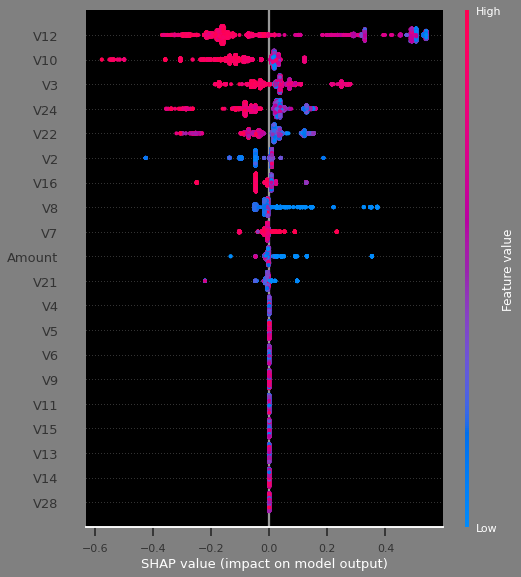

In [57]:
with plt.rc_context({'figure.facecolor':'grey'}):
    interpret_model(tuned_dt)

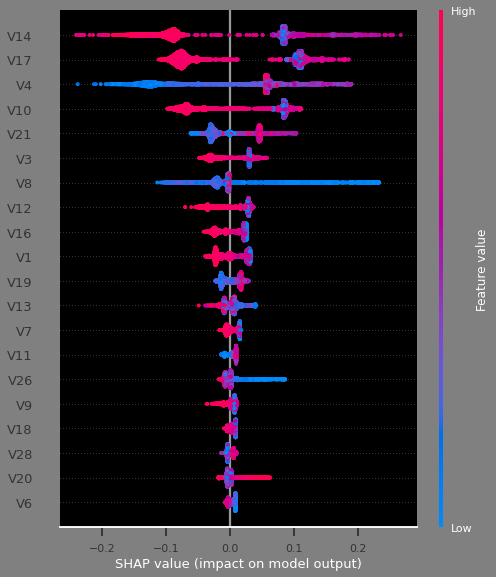

In [58]:
with plt.rc_context({'figure.facecolor':'grey'}):
    interpret_model(tuned_catboost)

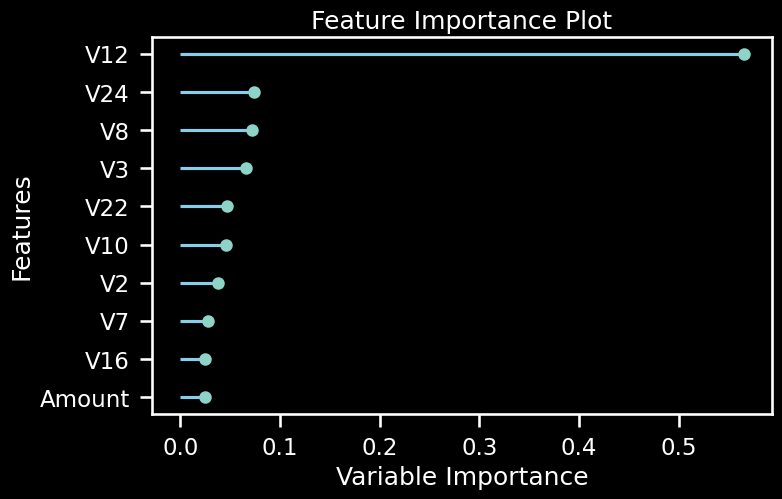

In [59]:
plot_model(tuned_dt, plot='feature')

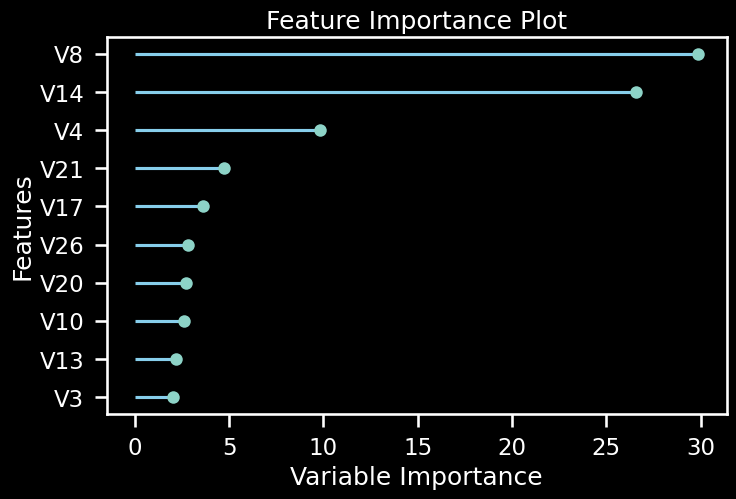

In [60]:
plot_model(tuned_catboost, plot='feature')

<span style="color:Blue"> Observation:

V14, V8 and V4 features were determined as important features.

# Ploting Model

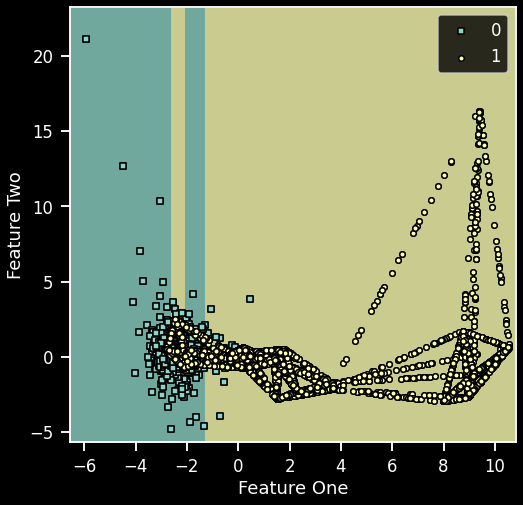

In [61]:
plt.figure(figsize=(8, 8))
plot_model(tuned_catboost, plot='boundary')

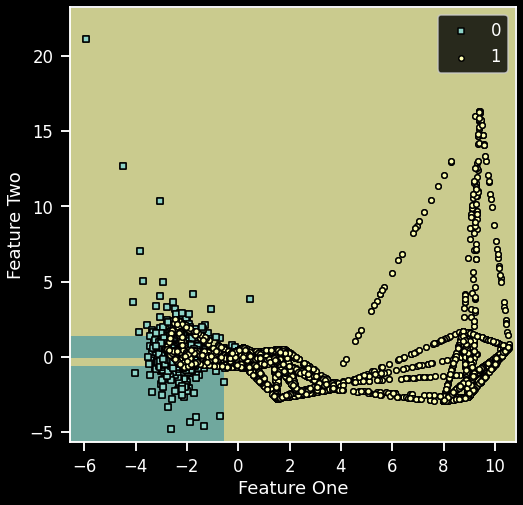

In [62]:
plt.figure(figsize=(8, 8))
plot_model(tuned_dt, plot='boundary')

<span style="color:Blue"> Observation:
    
When looking at the boundary in the model using the train dataset, it was drawn very clearly.

<Figure size 576x576 with 0 Axes>

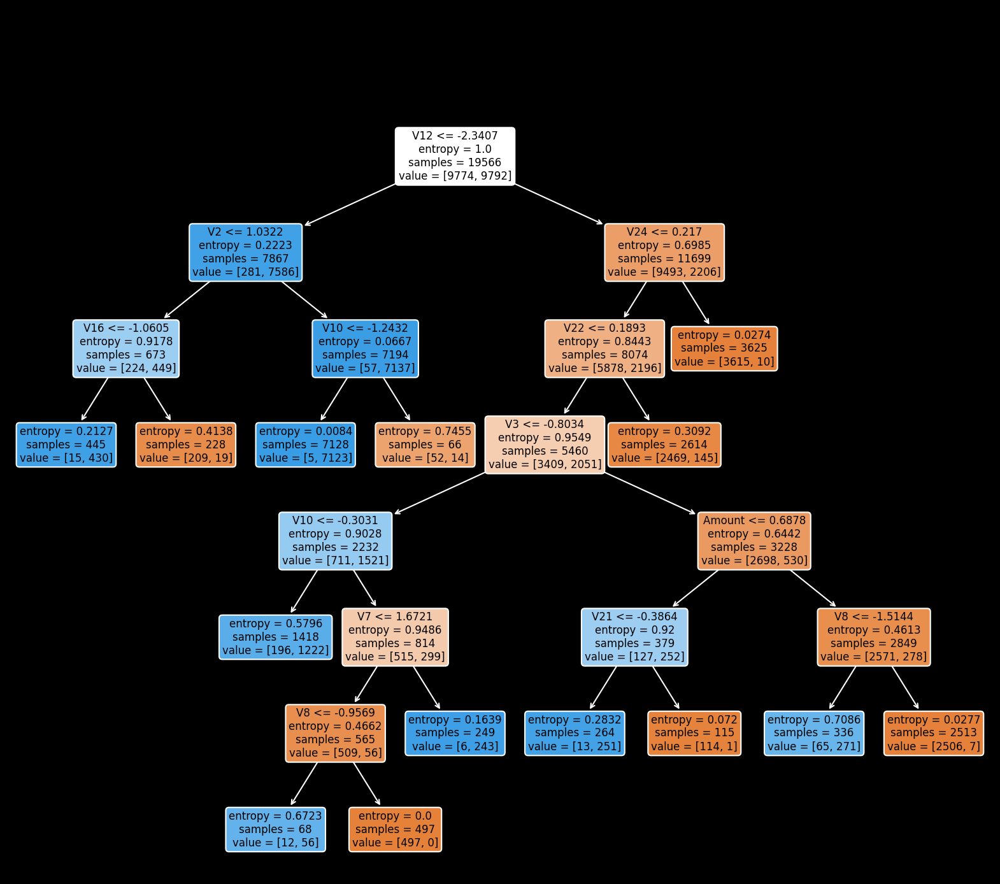

In [63]:
plt.figure(figsize=(8, 8))
with plt.rc_context({'figure.facecolor':'black','text.color':'black'}):
    plot_model(tuned_dt, plot='tree')

<span style="color:Blue"> Observation:
    
If you look at the picture above, you can check the conditions under which the decision tree is made.

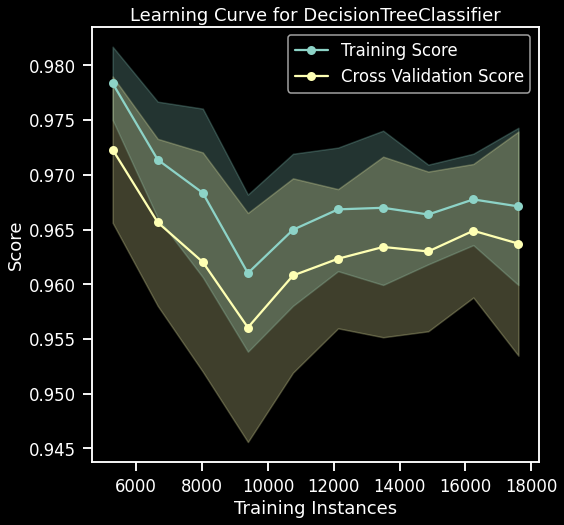

In [64]:
plt.figure(figsize=(8, 8))
plot_model(tuned_dt, plot='learning')

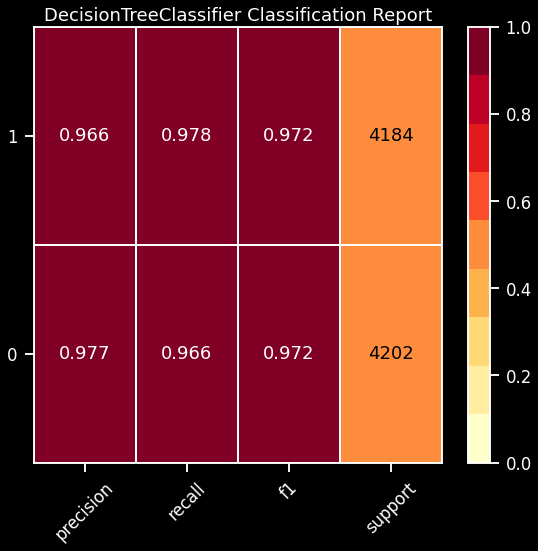

In [65]:
plt.figure(figsize=(8, 8))
plot_model(tuned_dt, plot='class_report')

# Predicting with the test dateset

In [66]:
pred = tuned_catboost.predict(X_test_smote)

In [67]:
final_model_result = confusion_matrix(y_test_smote, pred)
accuracy = accuracy_score(y_test_smote , pred)
precision = precision_score(y_test_smote , pred)
recall = recall_score(y_test_smote , pred)
f1 = f1_score(y_test_smote,pred) 
print('accuracy: {0:.4f}, precision: {1:.4f}, recall: {2:.4f},\
F1: {3:.4f}'.format(accuracy, precision, recall, f1))

accuracy: 0.8966, precision: 0.9881, recall: 0.8028,F1: 0.8859


Text(0.5, 1.0, 'Confusion Matrix (final_model)')

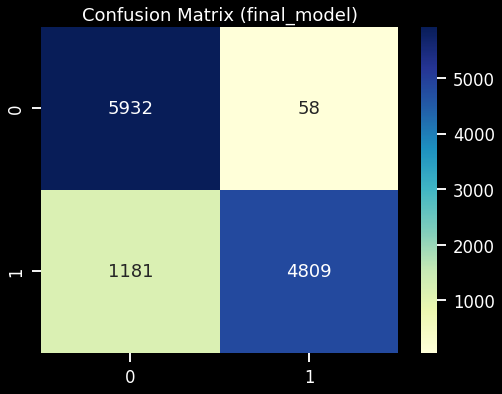

In [68]:
plt.figure(figsize=(8, 6))
ax = sns.heatmap(final_model_result, cmap = 'YlGnBu',annot = True, fmt='d')
ax.set_title('Confusion Matrix (final_model)')

<hr style="border: solid 3px blue;">